In [2]:
import os
from pathlib import Path
import decoupler as dc
import seaborn as sns
import scanpy as sc
from matplotlib import pyplot as plt
from matplotlib import rc_context

In [3]:
os.chdir(Path().resolve())
os.getcwd()

'/home/wu/datb1/AutoExtractSingleCell/03.skin_phase2/integrate_input_claude_3_5/all_output_copy'

In [4]:
sns.set_style("white")

In [5]:
sc.set_figure_params(vector_friendly=True, dpi_save=600) 

### Preprocess

In [6]:
adata_all = sc.read_h5ad('integrated_dataset_processed.h5ad')

In [7]:
adata_all

AnnData object with n_obs × n_vars = 443136 × 1910
    obs: 'Batch', 'Disease', 'n_genes', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'no_context_annotation', 'Certainty', 'Source', 'louvain_rough', 'Dataset', 'cell_type', 'leiden_rough', 'Diease', 'cell_type_raw', 'harmonized_cellhint_prior', 'leiden_scanorama', 'leiden_scanorama_prior', 'cell_type_leiden'
    uns: 'Dataset_colors', 'Disease_colors', 'cell_type_leiden_colors', 'leiden_scanorama', 'leiden_scanorama_colors', 'leiden_scanorama_prior', 'leiden_scanorama_prior_colors', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_scanorama', 'X_scanorama_prior', 'X_umap'
    obsp: 'connectivities', 'distances'

In [8]:
adata_all.obs.Dataset.unique()

['sample0', 'sample1', 'sample2', 'sample3', 'sample4', ..., 'sample14', 'sample15', 'sample18', 'sample19', 'sample20']
Length: 14
Categories (14, object): ['sample0', 'sample1', 'sample2', 'sample3', ..., 'sample15', 'sample18', 'sample19', 'sample20']

In [9]:
adata_all.obs.Disease = adata_all.obs.Disease.astype(str)
# Assign missing disease labels
adata_all.obs.loc[(adata_all.obs.Disease == 'nan') & (adata_all.obs.Batch == 'Skin304'), 'Disease'] = 'Psor'
adata_all.obs.loc[(adata_all.obs.Disease == 'nan') & (adata_all.obs.Batch.str.contains('Array403L|Array404L')), 'Disease'] = 'Acne'
adata_all.obs.loc[(adata_all.obs.Disease == 'nan') & (adata_all.obs.Batch == 'Leprosy'), 'Disease'] = 'Leprosy'
# Rename disease labels
adata_all.obs.loc[adata_all.obs.Disease == 'Healthy_old', 'Disease'] = 'Healthy Old'
adata_all.obs.loc[adata_all.obs.Disease == 'Healthy_young', 'Disease'] = 'Healthy Young'
adata_all.obs.loc[adata_all.obs.Disease == 'GA', 'Disease'] = 'Granuloma Annulare'

In [10]:
adata_all.obs.Disease.value_counts()

Disease
Healthy                110690
Psor                   101073
AD                      66992
Psor Normal             47946
Prurigo Nodularis       24688
Psor Emmigrating        19172
Healthy Old             16991
Healthy Newborn         16188
Healthy Young            7393
Leprosy                  7379
AD Normal                6159
Healthy Emmigrating      5168
Acne                     4663
Atopic Prurigo           3535
Granuloma Annulare       2438
Psor/AD                  1561
Alopecia                 1100
Name: count, dtype: int64

In [11]:
order = [
    'Psor', 'Psor Normal', 'Psor/AD', 'Psor Emmigrating', 'AD', 'AD Normal', 
    'Acne', 'Alopecia', 'Atopic Prurigo', 'Granuloma Annulare', 'Leprosy', 'Prurigo Nodularis', 
    'Healthy', 'Healthy Newborn', 'Healthy Young', 'Healthy Old', 'Healthy Emmigrating', 
]
adata_all.obs.Disease = adata_all.obs.Disease.astype('category')
adata_all.obs.Disease = adata_all.obs.Disease.cat.reorder_categories(order)

In [12]:
adata_all.obs.Dataset = adata_all.obs.Dataset.str.split().str[0]

### Overview

In [13]:
# unify cell type names
adata_all.obs.cell_type_leiden = adata_all.obs.cell_type_leiden.astype(str)
adata_all.obs.loc[adata_all.obs.cell_type_leiden.str.contains('Keratinocyte|keratinocyte'), 'cell_type_leiden'] = 'Keratinocyte'
adata_all.obs.loc[adata_all.obs.cell_type_leiden.str.contains('T cell'), 'cell_type_leiden'] = 'T cell'
adata_all.obs.loc[adata_all.obs.cell_type_leiden.str.contains('Endothelial|endothelial'), 'cell_type_leiden'] = 'Endothelial cell'

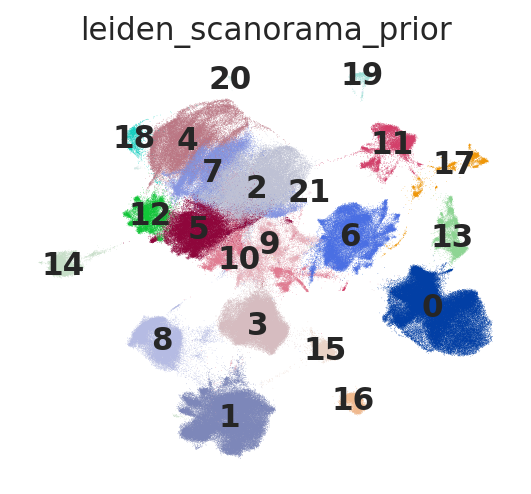

In [636]:
with rc_context({'figure.figsize': (4, 3.5)}):
    sc.pl.umap(adata_all, color=['leiden_scanorama_prior'], frameon=False, ncols=2, wspace=0.5, show=False, legend_loc='on data')
    plt.savefig('fig3/all_umap_metadata_leiden.pdf', bbox_inches='tight')
    plt.show()

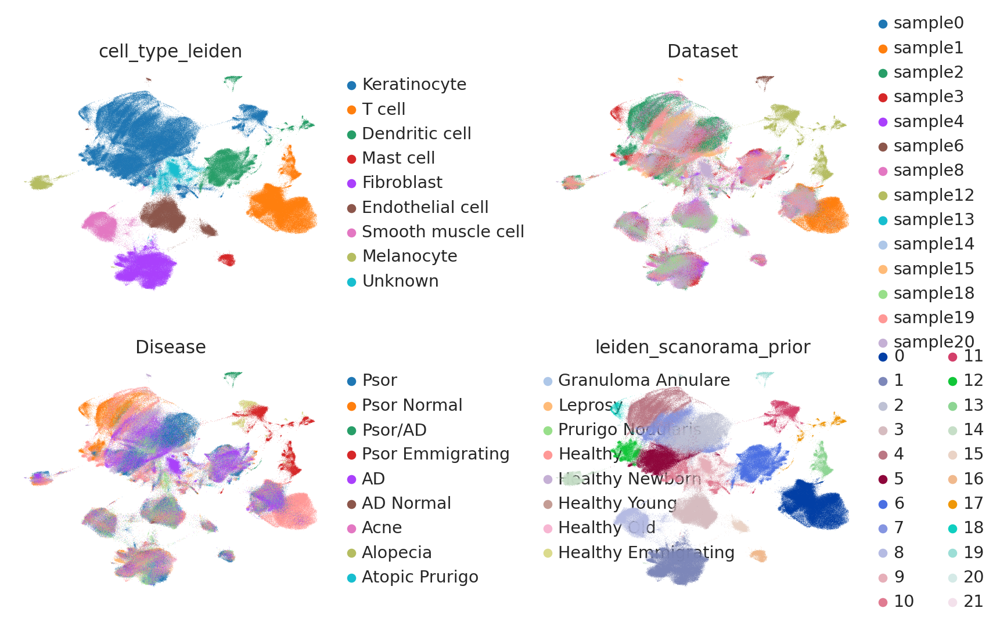

In [634]:
with rc_context({'figure.figsize': (4, 3.5)}):
    sc.pl.umap(adata_all, color=['cell_type_leiden', 'Dataset', 'Disease'], frameon=False, ncols=2, wspace=0.5, show=False)
    plt.savefig('fig3/all_umap_metadata.pdf', bbox_inches='tight')
    plt.show()

/home/wu/datb1/AutoExtractSingleCell/scExtract/src/scextract/utils/utils.py:214: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()  # Increase padding around the entire figure


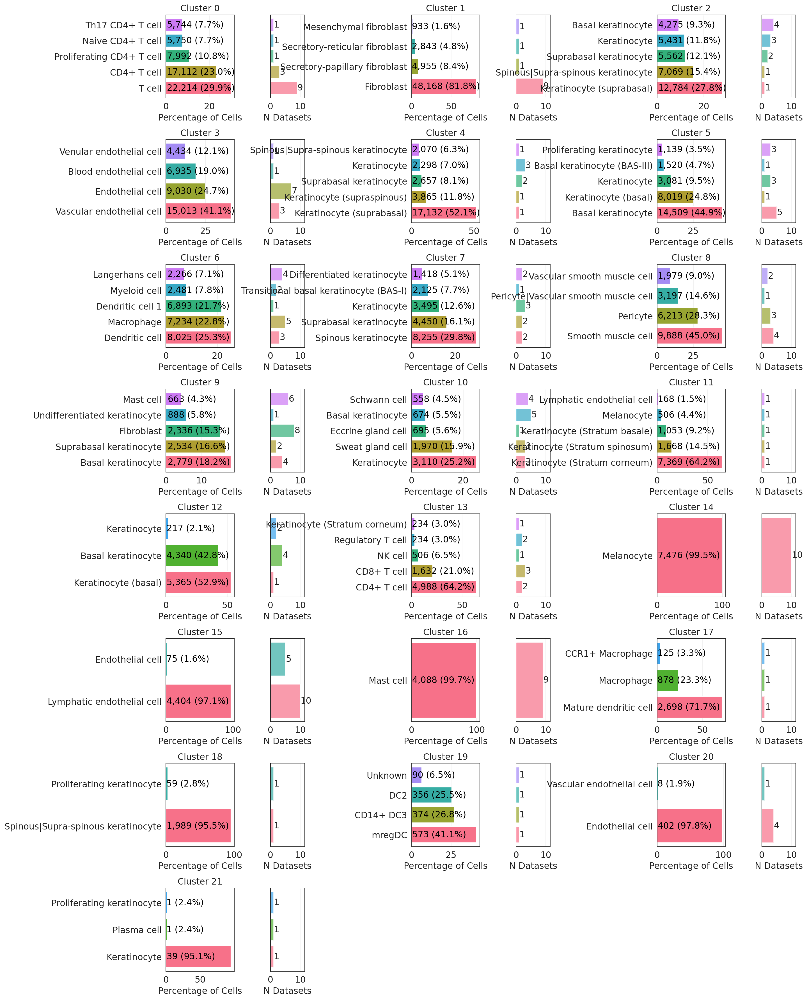

In [633]:
from scextract.utils import utils as scu
major_voting_df = scu.major_vote_top_clusters(adata_all.obs, leiden_key='leiden_scanorama_prior')
fig = scu.plot_multiple_cluster_composition(major_voting_df, figsize=(20, 3.5), ncols=3)
plt.savefig('fig3/majority_voting_cluster_composition.pdf', bbox_inches='tight')

/tmp/ipykernel_2933095/4206401228.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ax = (adata_all.obs.groupby(['Dataset', 'Disease']).size() / adata_all.obs.groupby('Dataset').size()).unstack() \
/tmp/ipykernel_2933095/4206401228.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ax = (adata_all.obs.groupby(['Dataset', 'Disease']).size() / adata_all.obs.groupby('Dataset').size()).unstack() \


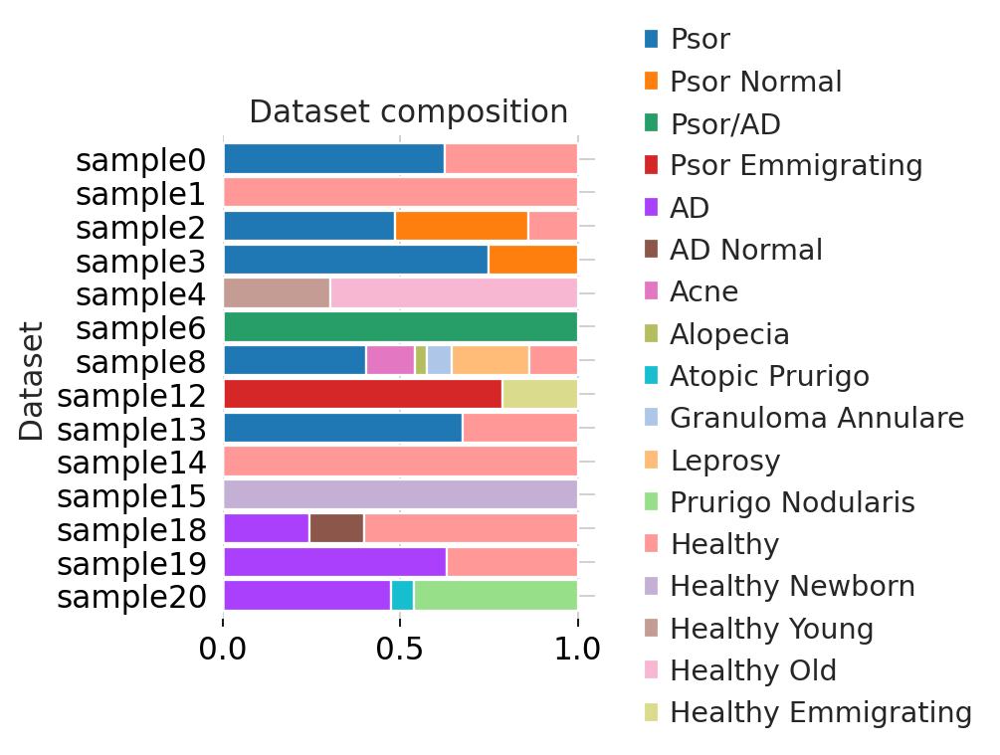

In [15]:
adata_all.obs['Dataset'] = adata_all.obs['Dataset'].cat.reorder_categories(adata_all.obs['Dataset'].cat.categories[::-1])
with rc_context({'figure.figsize': (3, 4)}):
    ax = (adata_all.obs.groupby(['Dataset', 'Disease']).size() / adata_all.obs.groupby('Dataset').size()).unstack() \
        .plot.barh(stacked=True, color=adata_all.uns['Disease_colors'], width=0.9)
    ax.legend(bbox_to_anchor=(1.1, 0.5), loc='center left', borderaxespad=0., frameon=False)
    sns.despine(left=True, bottom=True)
    plt.title("Dataset composition")
    plt.tick_params(top=False,bottom=True,left=False,right=False)
    plt.savefig('fig3/dataset_composition.pdf', bbox_inches='tight')
    plt.show()

In [16]:
adata_all.obs['Dataset'] = adata_all.obs['Dataset'].cat.reorder_categories(adata_all.obs['Dataset'].cat.categories[::-1])

In [17]:
adata_all.obs['cell_type_leiden'] = adata_all.obs['cell_type_leiden'].cat.reorder_categories(
    ['Keratinocyte', 'T cell', 'Dendritic cell', 'Mast cell', 'Fibroblast', 'Endothelial cell', 'Smooth muscle cell', 'Melanocyte', 'Unknown']
)

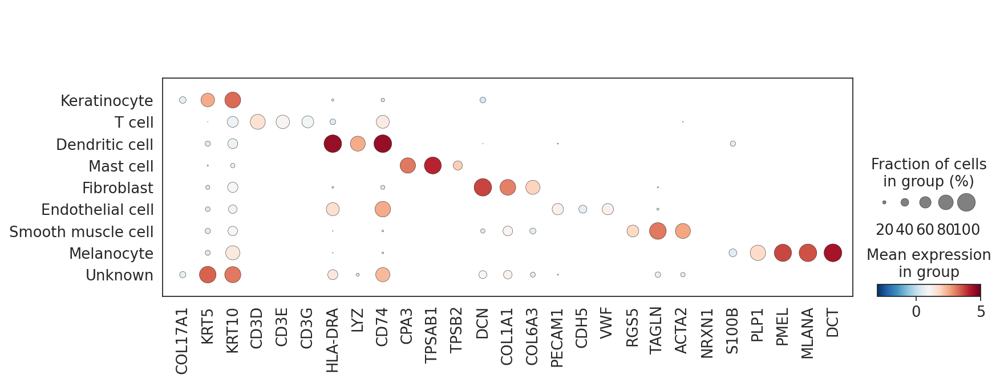

In [630]:
marker_genes = ["COL17A1", "KRT5", "KRT10", "CD3D","CD3E","CD3G",
                "HLA-DRA", "LYZ", "CD74","CPA3","TPSAB1","TPSB2",
                "DCN","COL1A1","COL6A3","PECAM1","CDH5","VWF","RGS5","TAGLN","ACTA2",
                "NRXN1","S100B","PLP1","PMEL", "MLANA", "DCT"]

with rc_context({'figure.figsize': (8, 7)}):
    sc.pl.dotplot(adata_all, marker_genes, groupby='cell_type_leiden', show=False, use_raw=True, dot_max=1, dot_min=0.1, color_map='RdBu_r', vmax=5, vmin=-3)
    plt.savefig('fig3/all_dotplot_markers.pdf', bbox_inches='tight')
    plt.show()

In [19]:
raw_annotation_fraction = adata_all.obs.groupby(['cell_type_leiden']).cell_type_raw.value_counts()
raw_annotation_fraction = raw_annotation_fraction[raw_annotation_fraction > 20]
raw_annotation_fraction.reset_index(name='count').head(20)
raw_annotation_fraction.to_csv('fig3/03_table_raw_annotation.csv')

/tmp/ipykernel_2933095/401630718.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  raw_annotation_fraction = adata_all.obs.groupby(['cell_type_leiden']).cell_type_raw.value_counts()


In [20]:
harmonized_annotation_fraction = adata_all.obs.groupby(['cell_type_leiden']).cell_type.value_counts()
harmonized_annotation_fraction = harmonized_annotation_fraction[harmonized_annotation_fraction > 20]

/tmp/ipykernel_2933095/1451626770.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  harmonized_annotation_fraction = adata_all.obs.groupby(['cell_type_leiden']).cell_type.value_counts()


In [21]:
adata_all.obs.loc[:, ['Dataset', 'Disease']].drop_duplicates().to_csv('fig3/03_table_dataset_disease_mapping.csv', index=False)

# t cell

In [29]:
adata_t_cell = adata_all[adata_all.obs['cell_type_leiden'].str.contains('T cell'), :].copy()
sc.pp.neighbors(adata_t_cell, n_neighbors=15, use_rep='X_scanorama_prior')
sc.tl.umap(adata_t_cell)

In [30]:
mistyping = adata_t_cell.obs.cell_type_raw.value_counts()[adata_t_cell.obs.cell_type_raw.value_counts() / adata_t_cell.shape[0] <= 0.01].index
adata_t_cell.obs.cell_type_raw = adata_t_cell.obs.cell_type_raw.astype(str)
adata_t_cell.obs.loc[adata_t_cell.obs.cell_type_raw.isin(mistyping), 'cell_type_raw'] = 'Other T cells'

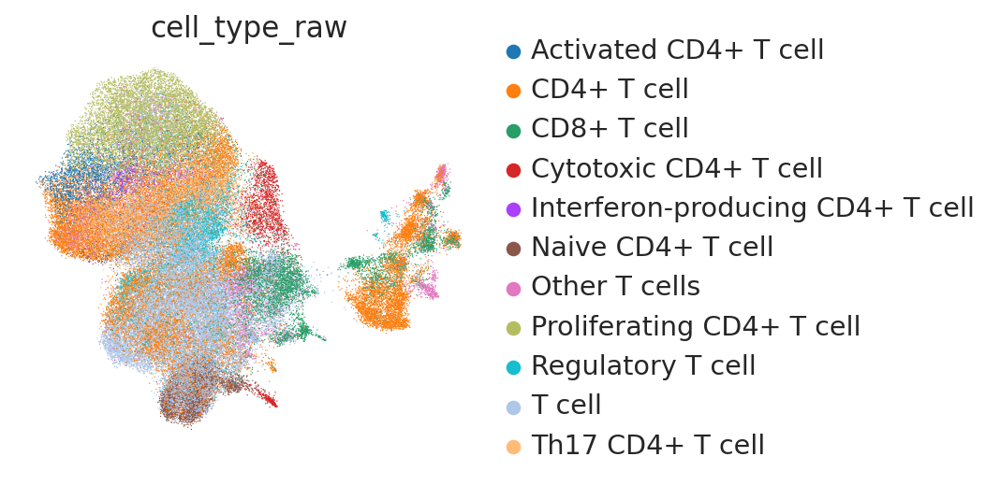

In [31]:
# del adata_t_cell.uns['cell_type_raw_colors']
with rc_context({'figure.figsize': (4, 3.5)}):
    sc.pl.umap(adata_t_cell, color=['cell_type_raw'], frameon=False, ncols=1, wspace=0.5, show=False)
    plt.savefig('fig3/t_cell_umap_raw.pdf', bbox_inches='tight')
    plt.show()

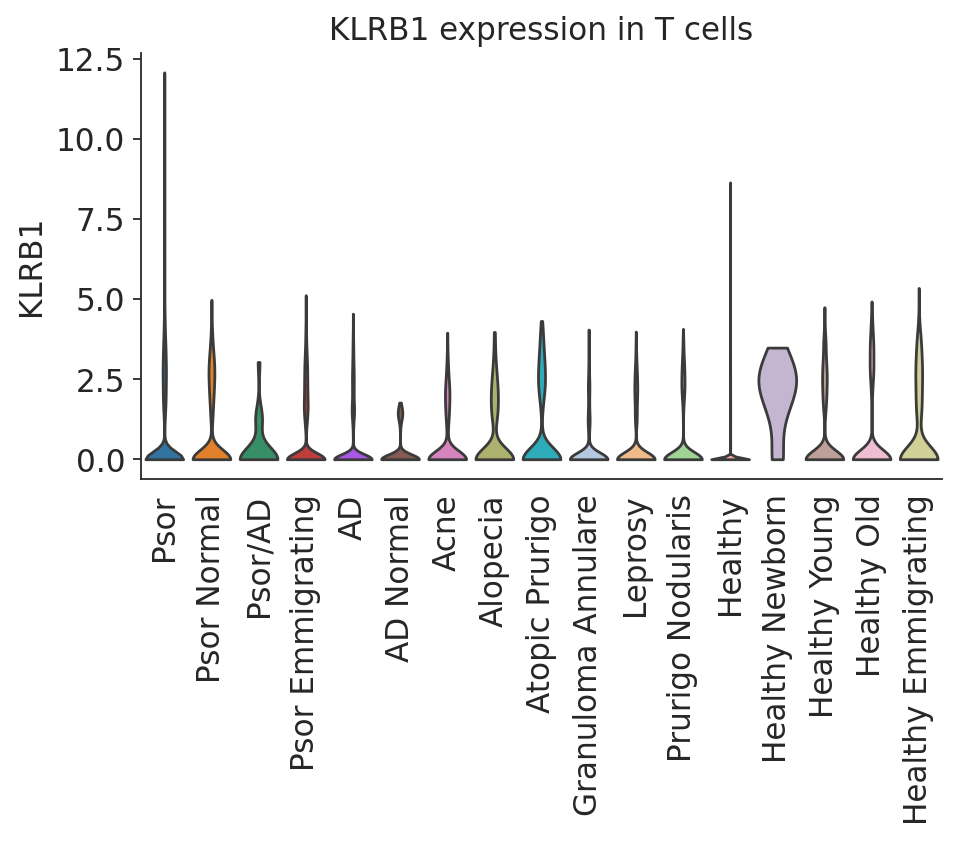

In [32]:
sns.set_style("white")
with rc_context({'figure.figsize': (6, 3.5)}):
    g = sc.pl.violin(adata_t_cell, keys='KLRB1', groupby='Disease', rotation=90, show=False, use_raw=True, stripplot=False)
    # move the legend out of the plot
    # g.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    g.yaxis.set_ticks_position('left')
    g.set_title('KLRB1 expression in T cells')
    sns.despine()
    plt.savefig('fig3/tcell_violin_KLRB1.pdf', bbox_inches='tight')

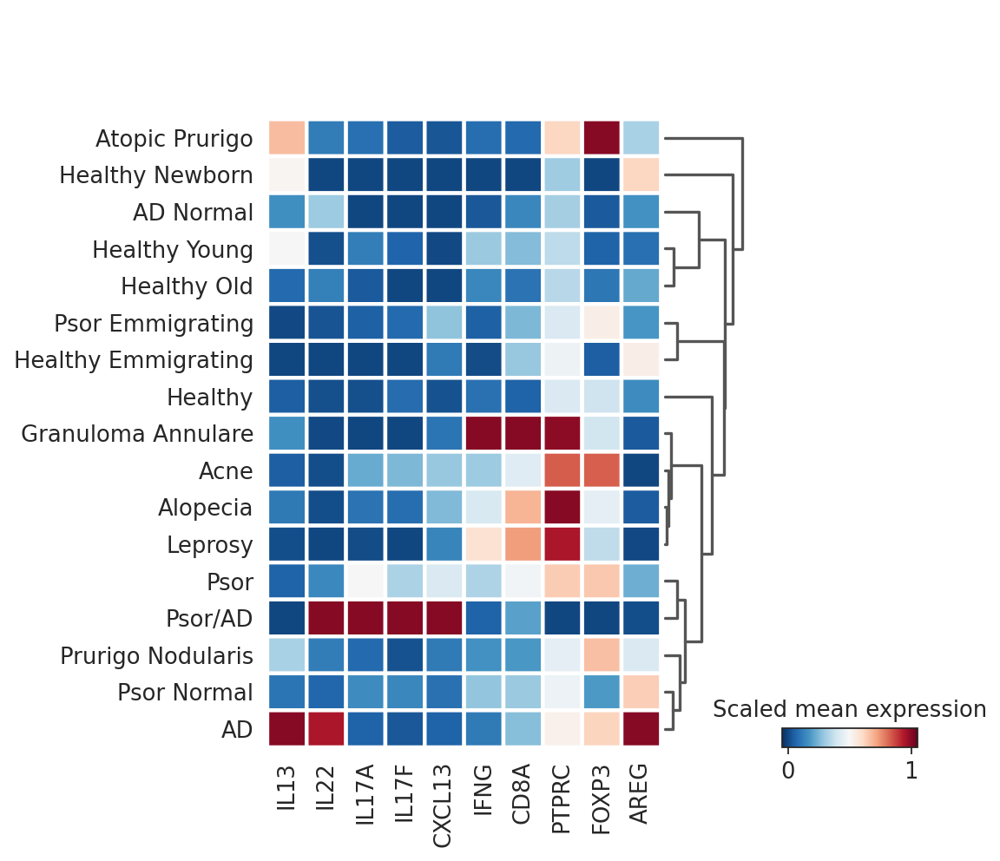

In [33]:
with rc_context({'figure.figsize': (6, 3.5)}):
    sc.tl.dendrogram(adata_t_cell, groupby='Disease', key_added='dendrogram_tcell')
    g = sc.pl.matrixplot(adata_t_cell, var_names=['IL13', 'IL22', 'IL17A', 'IL17F', 'CXCL13', 'IFNG', 'CD8A', 
                                                  'PTPRC', 'FOXP3', 'AREG'], return_fig=True, dendrogram='dendrogram_tcell', 
                         groupby='Disease', show=False, use_raw=True, cmap='RdBu_r', standard_scale='var', vmax=1.05, vmin=-0.05, colorbar_title='Scaled mean expression',
                         linewidths=0.1).style(cmap='RdBu_r', edge_color='white', edge_lw=2).get_axes()
    g['mainplot_ax'].spines['left'].set_visible(False)
    g['mainplot_ax'].spines['bottom'].set_visible(False)
    g['mainplot_ax'].spines['top'].set_visible(False)
    g['mainplot_ax'].spines['right'].set_visible(False)
    plt.savefig('fig3/tcell_matrixplot_cytokines.pdf', bbox_inches='tight')
    plt.show()

# Ker

In [680]:
adata_all.obs.cell_type_leiden.value_counts()

cell_type_leiden
Keratinocyte          174948
T cell                 82111
Fibroblast             58856
Endothelial cell       41473
Dendritic cell         36906
Smooth muscle cell     21971
Unknown                15254
Melanocyte              7515
Mast cell               4102
Name: count, dtype: int64

In [681]:
adata_ker = adata_all[adata_all.obs['cell_type_leiden'] == 'Keratinocyte'].copy()

In [682]:
sc.pp.neighbors(adata_ker, n_neighbors=15, use_rep='X_scanorama_prior', n_pcs=30)
sc.tl.leiden(adata_ker, key_added='leiden_ker')
sc.tl.umap(adata_ker)

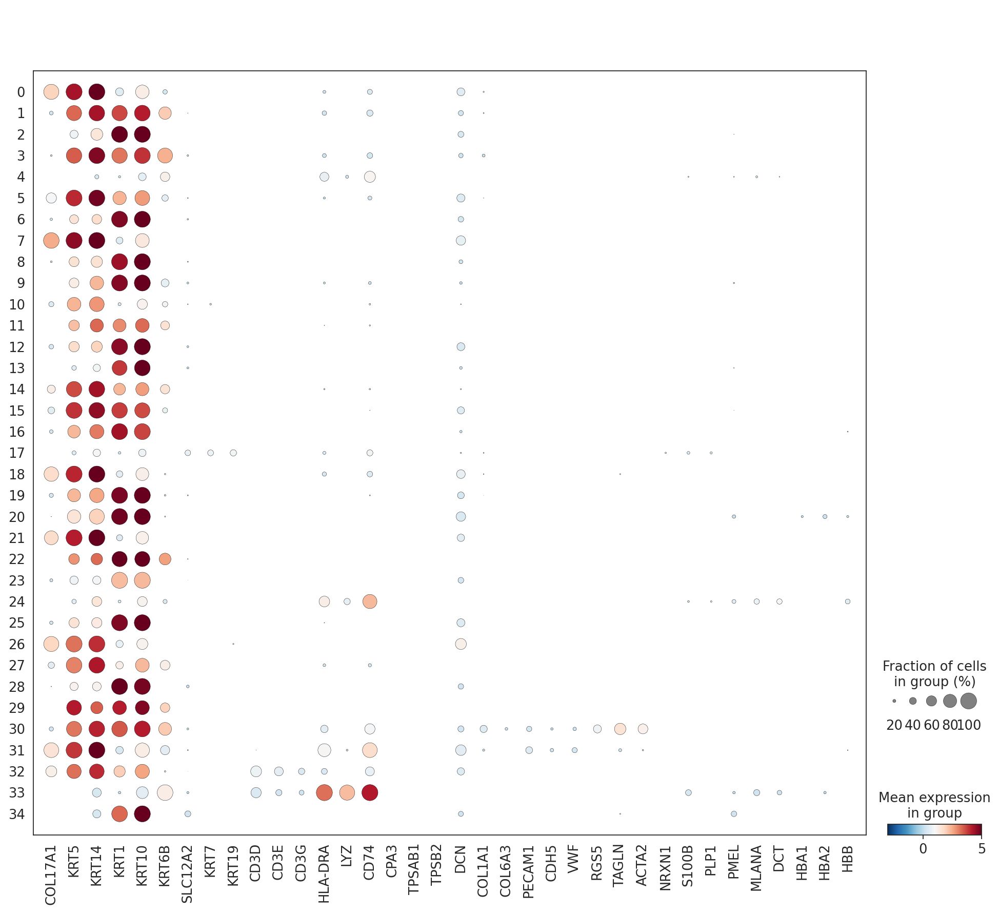

In [700]:
marker_genes = ["COL17A1", "KRT5", "KRT14", "KRT1", "KRT10", "KRT6B", "SLC12A2", "KRT7", "KRT19","CD3D","CD3E","CD3G",
                "HLA-DRA", "LYZ", "CD74","CPA3","TPSAB1","TPSB2",
                "DCN","COL1A1","COL6A3","PECAM1","CDH5","VWF","RGS5","TAGLN","ACTA2",
                "NRXN1","S100B","PLP1","PMEL", "MLANA", "DCT",'HBA1','HBA2','HBB']

with rc_context({'figure.figsize': (8, 7)}):
    sc.pl.dotplot(adata_ker, marker_genes, groupby='leiden_ker', show=False, use_raw=True, dot_max=1, dot_min=0.1, color_map='RdBu_r', vmax=5, vmin=-3)
adata_ker = adata_ker[~adata_ker.obs['leiden_ker'].isin(['4', '17', '24', '33']), :]

In [701]:
sc.pp.neighbors(adata_ker, n_neighbors=15, use_rep='X_scanorama_prior', n_pcs=30)
sc.tl.leiden(adata_ker, key_added='leiden_ker')
sc.tl.umap(adata_ker)

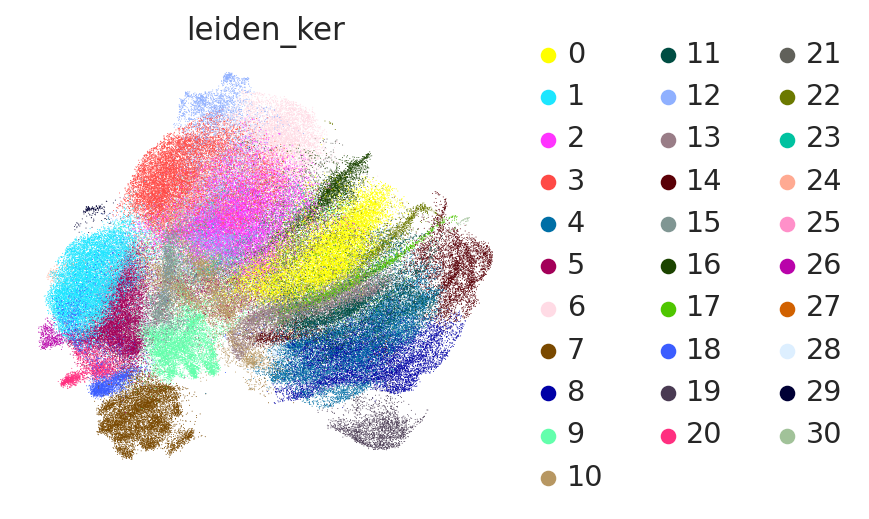

In [702]:
with rc_context({'figure.figsize': (4, 3.5)}):
    sc.pl.umap(adata_ker, color='leiden_ker', frameon=False, ncols=1, show=False)
    plt.savefig('fig3/kera_umap_scanorama_prior_all.pdf', bbox_inches='tight')
    plt.show()

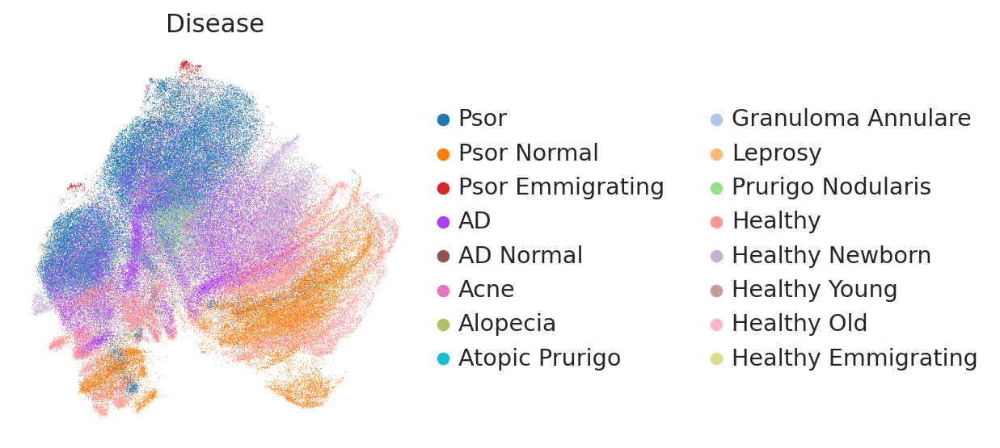

In [703]:
adata_all_color_dict = {}
for i, c in enumerate(adata_all.obs['Disease'].cat.categories):
    adata_all_color_dict[c] = adata_all.uns['Disease_colors'][i]

adata_ker.uns['Disease_colors'] = []
for c in adata_ker.obs['Disease'].cat.categories:
    adata_ker.uns['Disease_colors'].append(adata_all_color_dict[c])
sc.pl.umap(adata_ker, color='Disease', frameon=False, ncols=1)

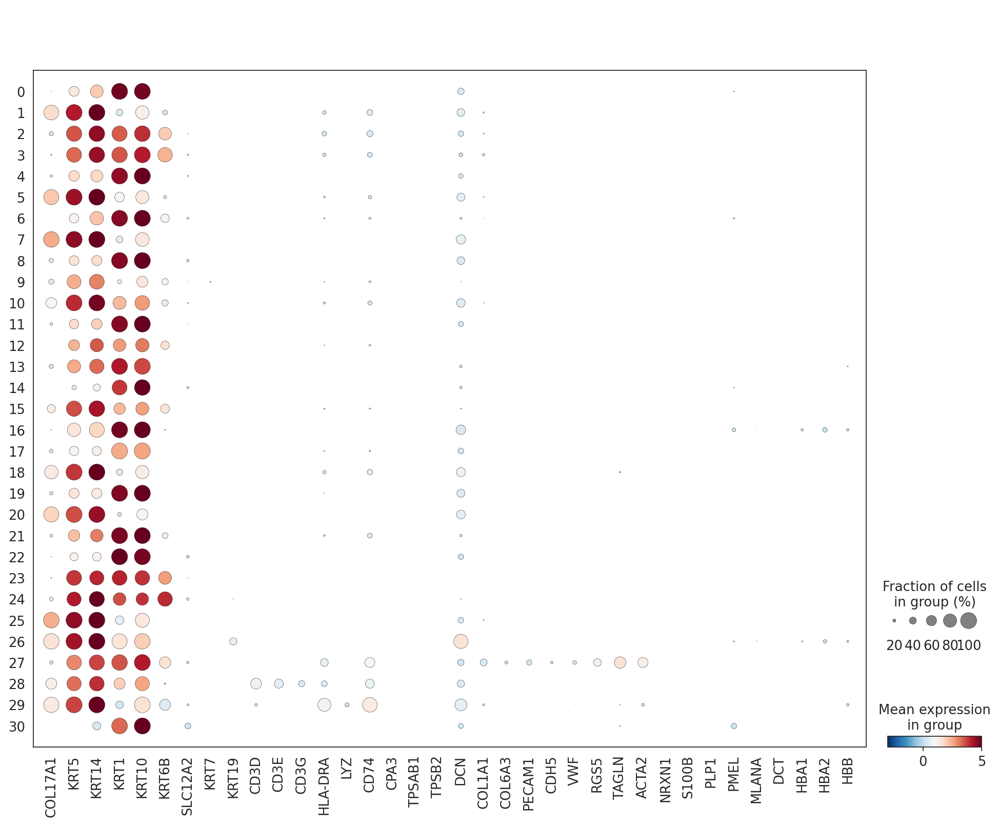

In [704]:
marker_genes = ["COL17A1", "KRT5", "KRT14", "KRT1", "KRT10", "KRT6B", "SLC12A2", "KRT7", "KRT19","CD3D","CD3E","CD3G",
                "HLA-DRA", "LYZ", "CD74","CPA3","TPSAB1","TPSB2",
                "DCN","COL1A1","COL6A3","PECAM1","CDH5","VWF","RGS5","TAGLN","ACTA2",
                "NRXN1","S100B","PLP1","PMEL", "MLANA", "DCT",'HBA1','HBA2','HBB']

with rc_context({'figure.figsize': (8, 7)}):
    sc.pl.dotplot(adata_ker, marker_genes, groupby='leiden_ker', show=False, use_raw=True, dot_max=1, dot_min=0.1, color_map='RdBu_r', vmax=5, vmin=-3)
# adata_ker = adata_ker[~adata_ker.obs['leiden_ker'].isin(['6', '14', '20']), :]

In [705]:
import importlib
import scextract
# importlib.reload(scextract.utils.utils)
from scextract.utils import utils as scu
major_voting_df = scu.major_vote_top_clusters(adata_ker.obs, leiden_key='leiden_ker')

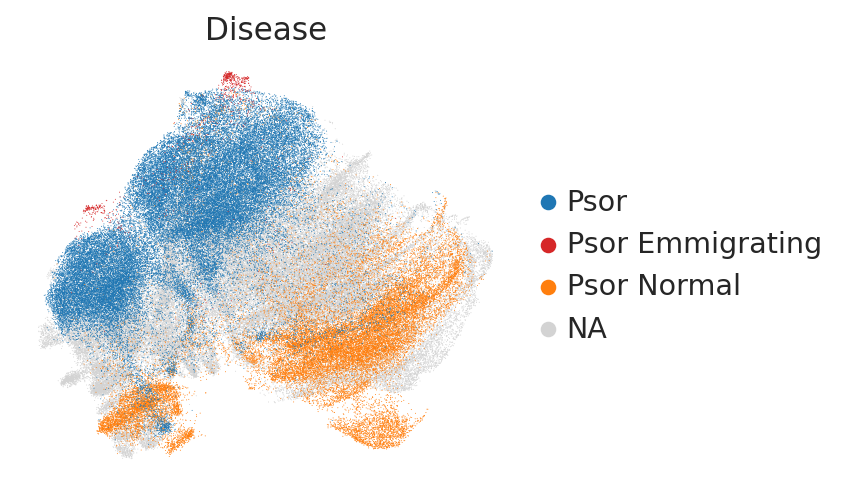

In [706]:
with rc_context({'figure.figsize': (4, 3.5)}):
    sc.pl.umap(adata_ker, color='Disease', groups=['Psor', 'Psor Normal', 'Psor/AD', 'Psor Emmigrating'], frameon=False, ncols=1, show=False)
    plt.savefig('fig3/kera_umap_disease_01.pdf', bbox_inches='tight')
    plt.show()

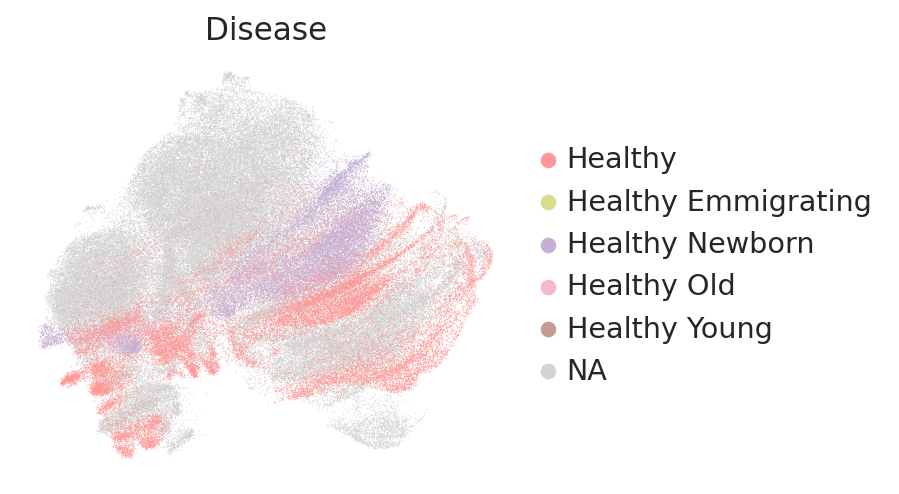

In [707]:
with rc_context({'figure.figsize': (4, 3.5)}):
    sc.pl.umap(adata_ker, color='Disease', groups=['Healthy', 'Healthy Newborn', 'Healthy Young', 'Healthy Old', 'Healthy Emmigrating'], frameon=False, ncols=1, show=False)
    plt.savefig('fig3/kera_umap_disease_02.pdf', bbox_inches='tight')
    plt.show()

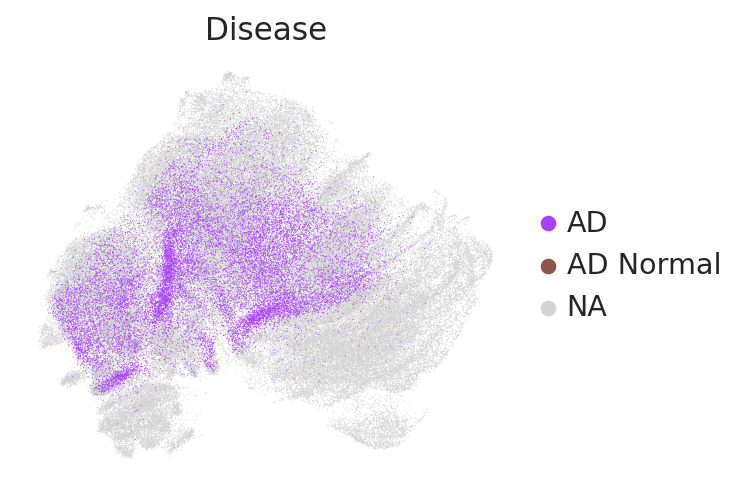

In [708]:
with rc_context({'figure.figsize': (4, 3.5)}):
    sc.pl.umap(adata_ker, color='Disease', groups=['AD', 'AD Normal'], frameon=False, ncols=1, show=False)
    plt.savefig('fig3/kera_umap_disease_03.pdf', bbox_inches='tight')
    plt.show()

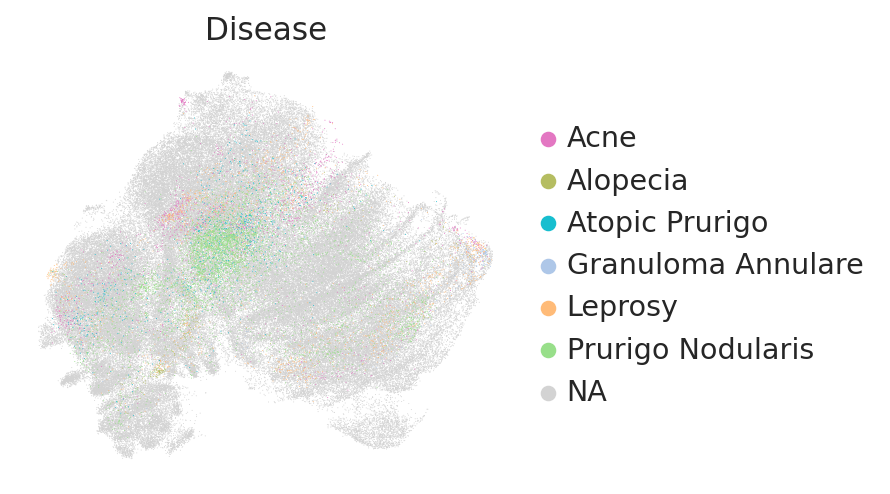

In [709]:
with rc_context({'figure.figsize': (4, 3.5)}):
    sc.pl.umap(adata_ker, color='Disease', groups=['Acne', 'Alopecia', 'Atopic Prurigo', 'Granuloma Annulare', 'Leprosy', 'Prurigo Nodularis'], frameon=False, ncols=1, show=False)
    plt.savefig('fig3/kera_umap_disease_04.pdf', bbox_inches='tight')
    plt.show()

In [710]:
adata_ker.obs.groupby(['Disease', 'Dataset']).size()[adata_ker.obs.groupby(['Disease', 'Dataset']).size() > 5]

/tmp/ipykernel_2933095/3831621583.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata_ker.obs.groupby(['Disease', 'Dataset']).size()[adata_ker.obs.groupby(['Disease', 'Dataset']).size() > 5]
/tmp/ipykernel_2933095/3831621583.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata_ker.obs.groupby(['Disease', 'Dataset']).size()[adata_ker.obs.groupby(['Disease', 'Dataset']).size() > 5]


Disease              Dataset 
Psor                 sample0       498
                     sample2     27630
                     sample3     16770
                     sample8      4323
Psor Normal          sample2     23025
                     sample3      5250
Psor Emmigrating     sample12      768
AD                   sample18     1074
                     sample19    13230
                     sample20     7987
AD Normal            sample18      282
Acne                 sample8      1406
Alopecia             sample8       221
Atopic Prurigo       sample20      857
Granuloma Annulare   sample8       217
Leprosy              sample8      1757
Prurigo Nodularis    sample20     5406
Healthy              sample0       341
                     sample2      8237
                     sample8      1822
                     sample14     5845
                     sample18     7777
                     sample19     7685
Healthy Newborn      sample15    14544
Healthy Young        sample4      

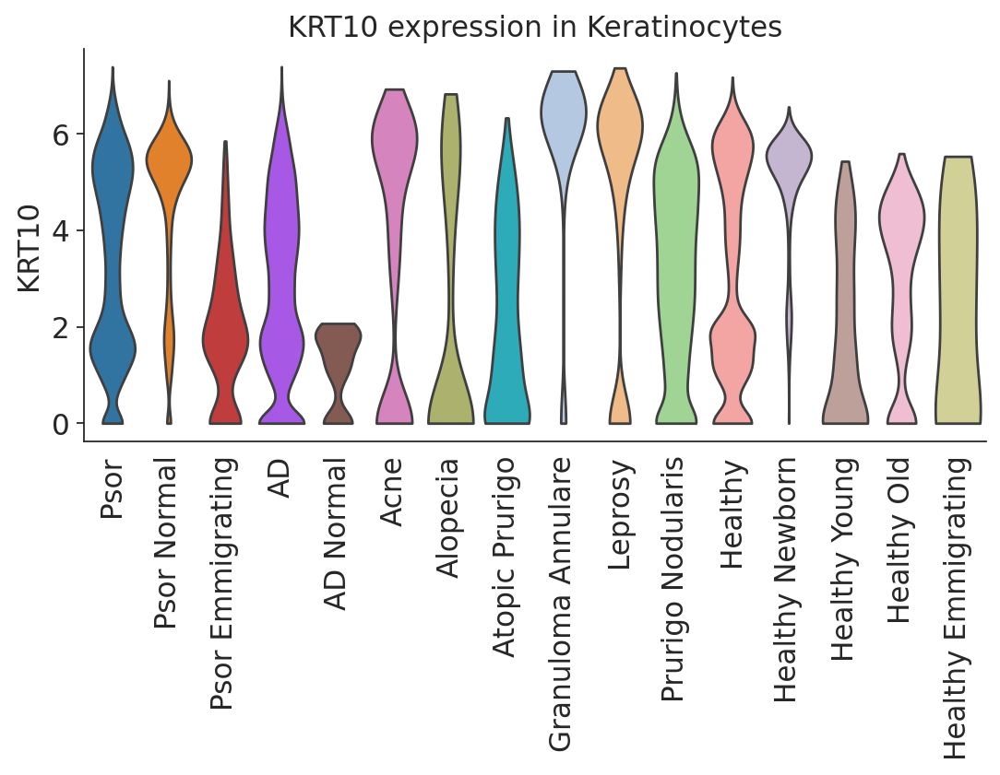

In [711]:
with rc_context({'figure.figsize': (7, 3.5)}):
    g = sc.pl.violin(adata_ker, keys='KRT10', groupby='Disease', rotation=90, show=False, use_raw=True, stripplot=False)
    # move the legend out of the plot
    # g.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    g.yaxis.set_ticks_position('left')
    g.set_title('KRT10 expression in Keratinocytes')
    sns.despine()
    plt.savefig('fig3/kera_violin_KRT10.pdf', bbox_inches='tight')

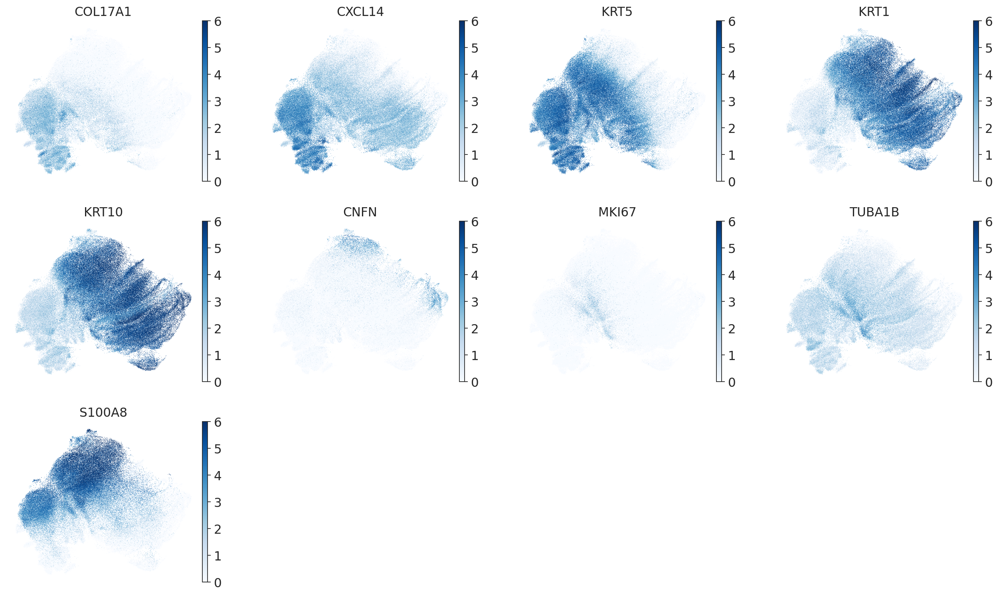

In [712]:
with rc_context({'figure.figsize': (4, 3.5)}):
    ax = sc.pl.umap(adata_ker, color=['COL17A1', 'CXCL14', 'KRT5', 'KRT1', 'KRT10', 'CNFN', 'MKI67', 'TUBA1B', 'S100A8'], ncols=4, show=False, frameon=False, \
        cmap='Blues', use_raw=True, vmin=0, vmax=6)
    plt.savefig('fig3/kera_umap_markers.pdf', bbox_inches='tight')
    plt.show()

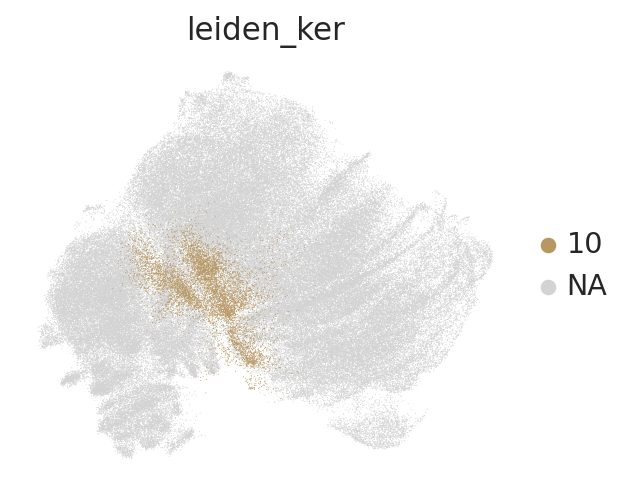

In [716]:
with rc_context({'figure.figsize': (4, 3.5)}):
    sc.pl.umap(adata_ker, color='leiden_ker', frameon=False, show=False, groups=['10'])
    plt.savefig('fig3/kera_umap_cluster_8.pdf', bbox_inches='tight')
    plt.show()

<Axes: title={'center': 'leiden_ker_scanorama'}, xlabel='UMAP1', ylabel='UMAP2'>

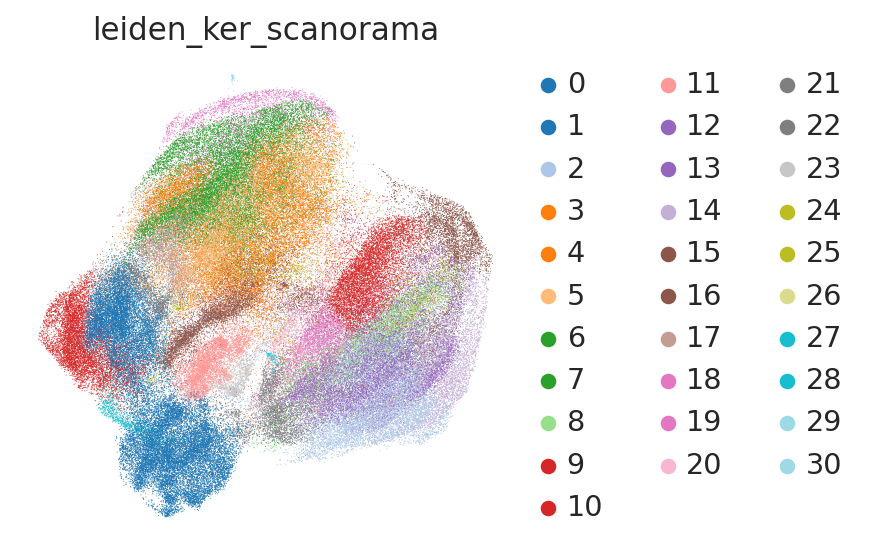

In [717]:
sc.pp.neighbors(adata_ker, n_neighbors=15, use_rep='X_scanorama', n_pcs=30)
sc.tl.leiden(adata_ker, key_added='leiden_ker_scanorama')
sc.tl.umap(adata_ker)
sc.pl.umap(adata_ker, color=['leiden_ker_scanorama'], frameon=False, ncols=1, wspace=0.5, show=False, palette='tab20')

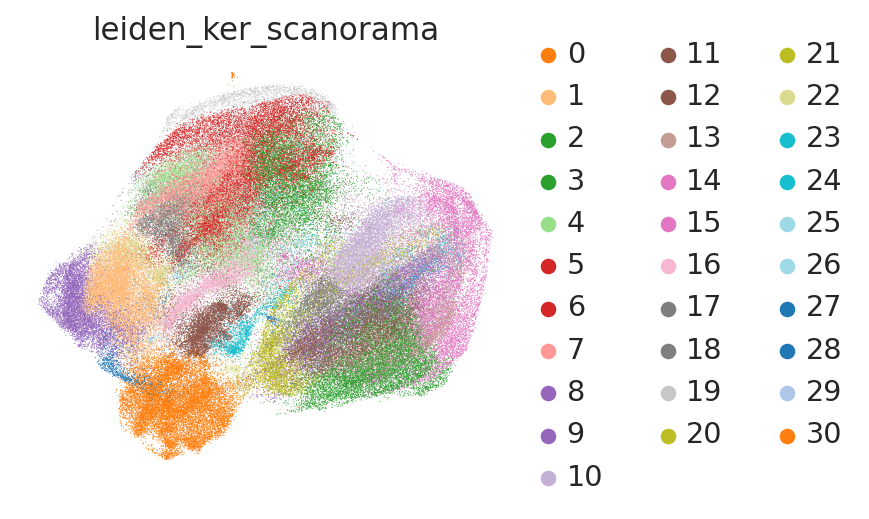

In [718]:
# shift color palette
adata_ker.uns['leiden_ker_scanorama_colors'] = adata_ker.uns['leiden_ker_scanorama_colors'][4:] + adata_ker.uns['leiden_ker_scanorama_colors'][:4]
with rc_context({'figure.figsize': (4, 3.5)}):
    ax = sc.pl.umap(adata_ker, color='leiden_ker_scanorama', show=False, frameon=False, \
        cmap='Blues', use_raw=True)
    plt.savefig('fig3/kera_umap_leiden_scanorama_raw.pdf', bbox_inches='tight')
    plt.show()

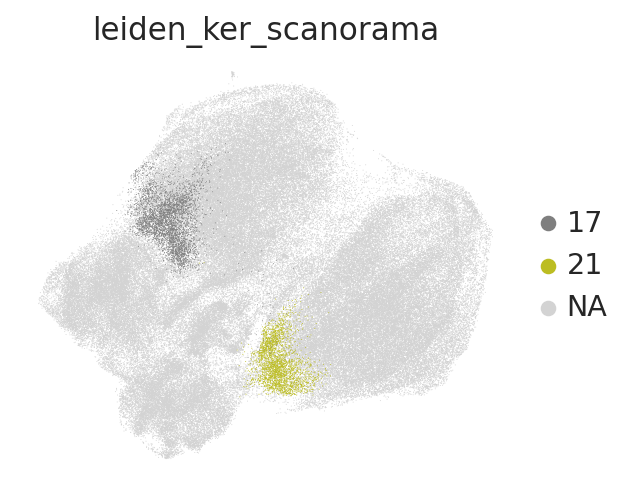

In [722]:
with rc_context({'figure.figsize': (4, 3.5)}):
    ax = sc.pl.umap(adata_ker, color='leiden_ker_scanorama', groups=['17', '21'],show=False, frameon=False, \
        cmap='Blues', use_raw=True)
    plt.savefig('fig3/kera_umap_leiden_scanorama_raw_18_20.pdf', bbox_inches='tight')
    plt.show()

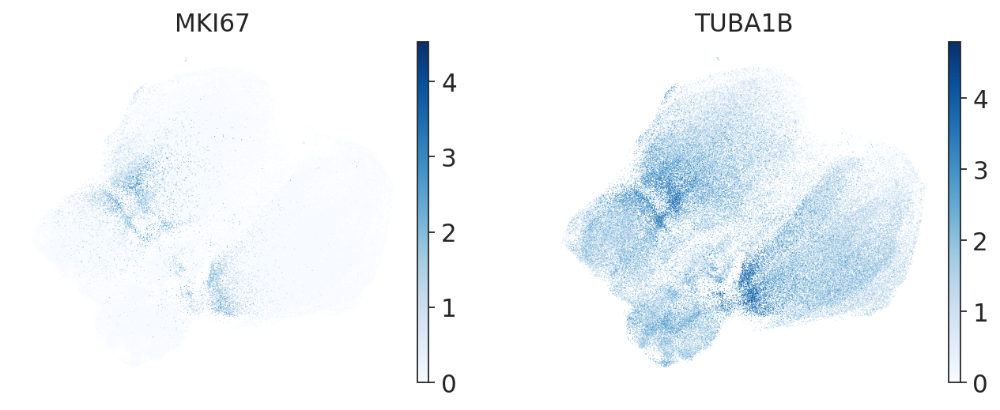

In [720]:
with rc_context({'figure.figsize': (4, 3.5)}):
    ax = sc.pl.umap(adata_ker, color=['MKI67', 'TUBA1B'], ncols=2, show=False, frameon=False, \
        cmap='Blues', use_raw=True)
    plt.savefig('fig3/kera_umap_markers_proli_scanorama_raw.pdf', bbox_inches='tight')
    plt.show()

### Further subsetting

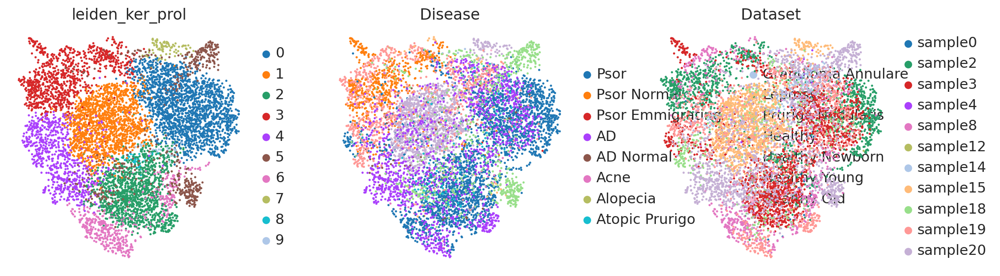

In [724]:
adata_ker_prol = adata_ker[adata_ker.obs['leiden_ker'] == '10', :].copy()
sc.pp.neighbors(adata_ker_prol, n_neighbors=15, use_rep='X_scanorama_prior', n_pcs=30)
sc.tl.leiden(adata_ker_prol, key_added='leiden_ker_prol', resolution=0.6)
sc.tl.umap(adata_ker_prol)
sc.pl.umap(adata_ker_prol, color=['leiden_ker_prol', 'Disease', 'Dataset'], frameon=False)

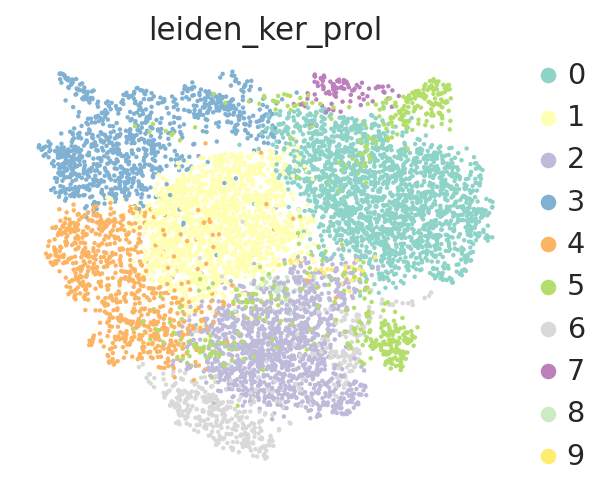

In [725]:
# sc.tl.leiden(adata_ker_prol, resolution=0.5)
# if 'leiden_colors' in adata_ker_prol.uns:
#     del adata_ker_prol.uns['leiden_colors']
with rc_context({'figure.figsize': (4, 3.5)}):
    ax = sc.pl.umap(adata_ker_prol, color=['leiden_ker_prol'], show=False, frameon=False, palette='Set3')
    plt.savefig('fig3/proliferating_kera_umap_leiden.pdf', bbox_inches='tight')
    plt.show()

/tmp/ipykernel_2933095/2799756879.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ax = (adata_ker_prol.obs.groupby(['leiden_ker_prol', 'Batch']).size() / adata_ker_prol.obs.groupby('leiden_ker_prol').size()).unstack() \
/tmp/ipykernel_2933095/2799756879.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ax = (adata_ker_prol.obs.groupby(['leiden_ker_prol', 'Batch']).size() / adata_ker_prol.obs.groupby('leiden_ker_prol').size()).unstack() \


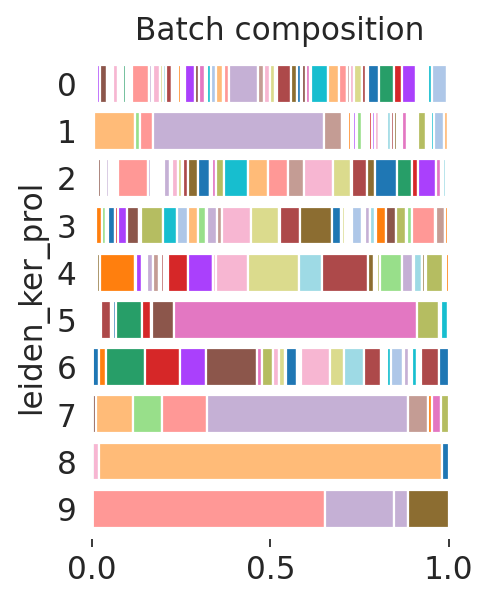

In [726]:
adata_ker_prol.obs['leiden_ker_prol'] = adata_ker_prol.obs['leiden_ker_prol'].cat.reorder_categories(adata_ker_prol.obs['leiden_ker_prol'].cat.categories[::-1])
with rc_context({'figure.figsize': (3, 4)}):
    ax = (adata_ker_prol.obs.groupby(['leiden_ker_prol', 'Batch']).size() / adata_ker_prol.obs.groupby('leiden_ker_prol').size()).unstack() \
        .plot.barh(stacked=True, width=0.8)
    ax.legend().remove()
    sns.despine(left=True, bottom=True)
    plt.title("Batch composition")
    plt.tick_params(top=False,bottom=True,left=False,right=False)
    plt.savefig('fig3/proliferating_kera_batch_composition.pdf', bbox_inches='tight')
    plt.show()

/tmp/ipykernel_2933095/3755559392.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ax = (adata_ker_prol.obs.groupby(['leiden_ker_prol', 'Disease']).size() / adata_ker_prol.obs.groupby('leiden_ker_prol').size()).unstack() \
/tmp/ipykernel_2933095/3755559392.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ax = (adata_ker_prol.obs.groupby(['leiden_ker_prol', 'Disease']).size() / adata_ker_prol.obs.groupby('leiden_ker_prol').size()).unstack() \


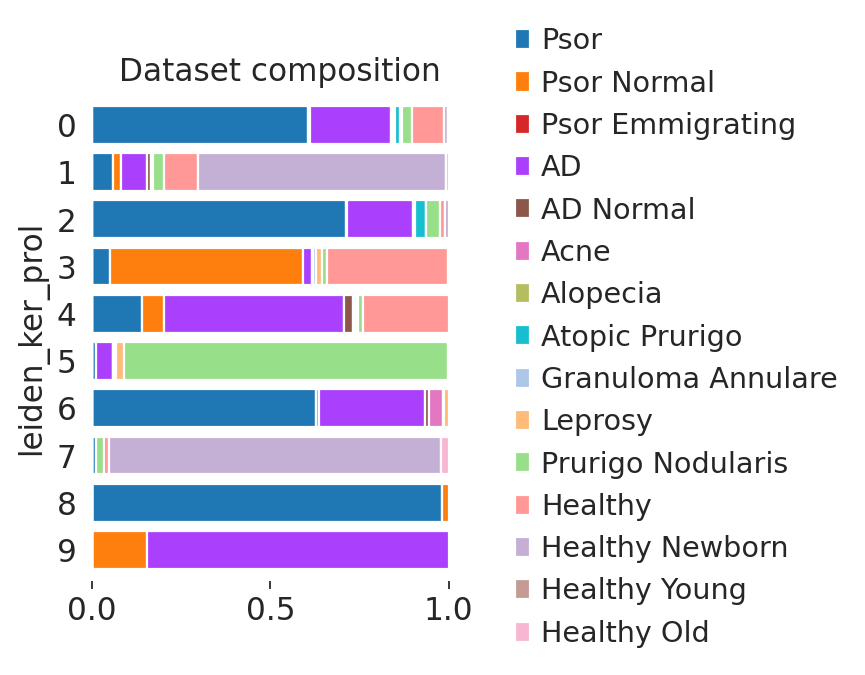

In [727]:
# adata_ker_prol.obs['leiden_ker_prol'] = adata_ker_prol.obs['leiden_ker_prol'].cat.reorder_categories(adata_ker_prol.obs['leiden_ker_prol'].cat.categories[::-1])
with rc_context({'figure.figsize': (3, 4)}):
    ax = (adata_ker_prol.obs.groupby(['leiden_ker_prol', 'Disease']).size() / adata_ker_prol.obs.groupby('leiden_ker_prol').size()).unstack() \
        .plot.barh(stacked=True, color=adata_ker_prol.uns['Disease_colors'], width=0.8)
    ax.legend(bbox_to_anchor=(1.1, 0.5), loc='center left', borderaxespad=0., frameon=False)
    sns.despine(left=True, bottom=True)
    plt.title("Dataset composition")
    plt.tick_params(top=False,bottom=True,left=False,right=False)
    plt.savefig('fig3/proliferating_kera_composition.pdf', bbox_inches='tight')
    plt.show()

/tmp/ipykernel_2933095/655831268.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ax = (adata_ker_prol.obs.groupby(['leiden_ker_prol', 'Dataset']).size() / adata_ker_prol.obs.groupby('leiden_ker_prol').size()).unstack() \
/tmp/ipykernel_2933095/655831268.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ax = (adata_ker_prol.obs.groupby(['leiden_ker_prol', 'Dataset']).size() / adata_ker_prol.obs.groupby('leiden_ker_prol').size()).unstack() \


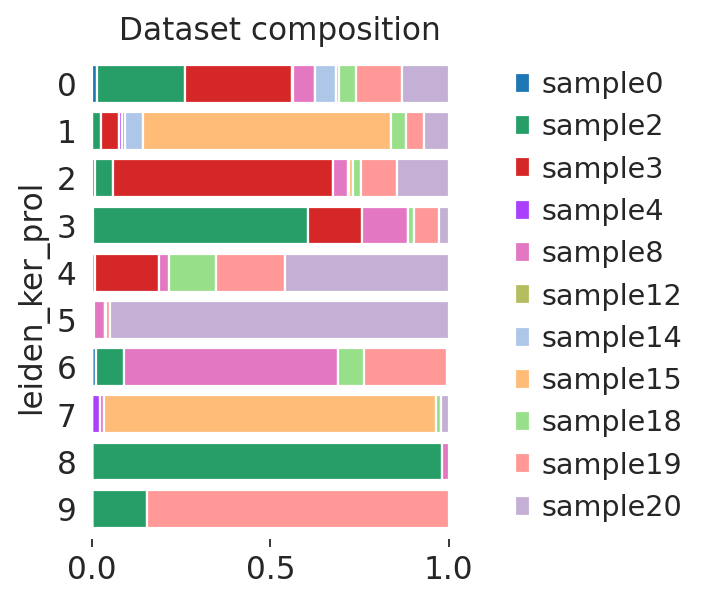

In [728]:
# adata_ker_prol.obs['leiden'] = adata_ker_prol.obs['leiden'].cat.reorder_categories(adata_ker_prol.obs['leiden'].cat.categories[::-1])
with rc_context({'figure.figsize': (3, 4)}):
    ax = (adata_ker_prol.obs.groupby(['leiden_ker_prol', 'Dataset']).size() / adata_ker_prol.obs.groupby('leiden_ker_prol').size()).unstack() \
        .plot.barh(stacked=True, color=adata_ker_prol.uns['Dataset_colors'], width=0.8)
    ax.legend(bbox_to_anchor=(1.1, 0.5), loc='center left', borderaxespad=0., frameon=False)
    sns.despine(left=True, bottom=True)
    plt.title("Dataset composition")
    plt.tick_params(top=False,bottom=True,left=False,right=False)
    plt.savefig('fig3/proliferating_kera_composition.pdf', bbox_inches='tight')
    plt.show()

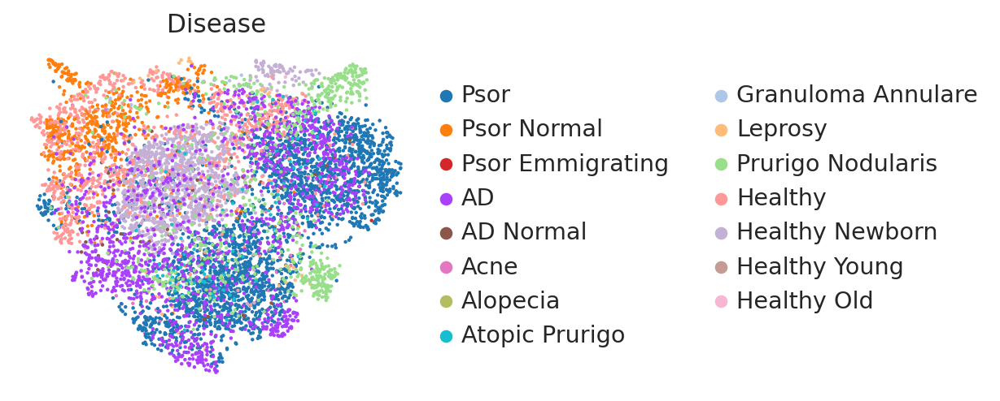

In [729]:
with rc_context({'figure.figsize': (4, 3.5)}):
    ax = sc.pl.umap(adata_ker_prol, color='Disease', show=False, frameon=False)
    plt.savefig('fig3/proliferating_kera_umap_disease.pdf', bbox_inches='tight')
    plt.show()

<Axes: title={'center': 'phase'}, xlabel='UMAP1', ylabel='UMAP2'>

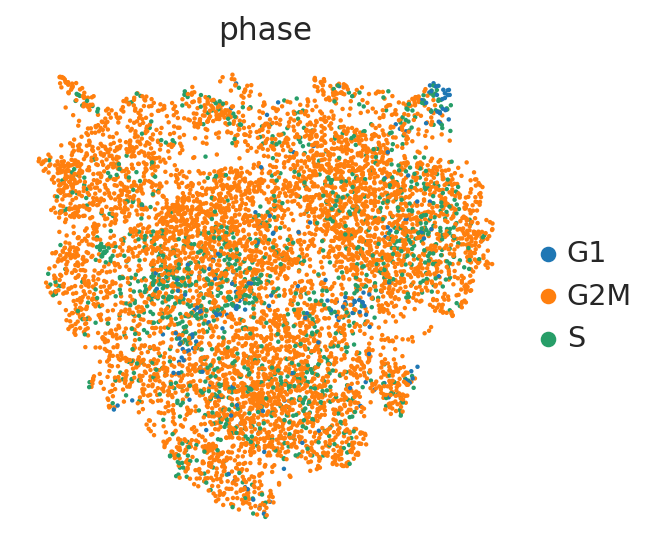

In [730]:
cc_genes = "MCM5,PCNA,TYMS,FEN1,MCM2,MCM4,RRM1,UNG,GINS2,MCM6,CDCA7,DTL,PRIM1,UHRF1,MLF1IP,HELLS,RFC2,RPA2,NASP,RAD51AP1,GMNN,WDR76,SLBP,CCNE2,UBR7,POLD3,MSH2,ATAD2,RAD51,RRM2,CDC45,CDC6,EXO1,TIPIN,DSCC1,BLM,CASP8AP2,USP1,CLSPN,POLA1,CHAF1B,BRIP1,E2F8,HMGB2,CDK1,NUSAP1,UBE2C,BIRC5,TPX2,TOP2A,NDC80,CKS2,NUF2,CKS1B,MKI67,TMPO,CENPF,TACC3,FAM64A,SMC4,CCNB2,CKAP2L,CKAP2,AURKB,BUB1,KIF11,ANP32E,TUBB4B,GTSE1,KIF20B,HJURP,CDCA3,HN1,CDC20,TTK,CDC25C,KIF2C,RANGAP1,NCAPD2,DLGAP5,CDCA2,CDCA8,ECT2,KIF23,HMMR,AURKA,PSRC1,ANLN,LBR,CKAP5,CENPE,CTCF,NEK2,G2E3,GAS2L3,CBX5,CENPA"
cc_genes = cc_genes.split(',')

s_genes = cc_genes[:43]
g2m_genes = cc_genes[43:]

sc.tl.score_genes_cell_cycle(adata_ker_prol, s_genes=s_genes, g2m_genes=g2m_genes)
sc.pl.umap(adata_ker_prol, color='phase', frameon=False, show=False)

In [750]:
adata_ker_prol.obs.Disease.value_counts() / adata_ker_prol.obs.Disease.value_counts().sum()

Disease
Psor                  0.353184
AD                    0.181709
Healthy Newborn       0.153662
Healthy               0.110328
Prurigo Nodularis     0.085072
Psor Normal           0.081218
Atopic Prurigo        0.010900
AD Normal             0.007311
Leprosy               0.006779
Acne                  0.005051
Healthy Old           0.002127
Granuloma Annulare    0.001728
Healthy Young         0.000532
Psor Emmigrating      0.000266
Alopecia              0.000133
Name: count, dtype: float64

In [751]:
adata_ker_prol[adata_ker_prol.obs.leiden_ker_prol.isin(['0', '7'])].obs.Disease.value_counts() / adata_ker_prol[adata_ker_prol.obs.leiden_ker_prol.isin(['0', '7'])].obs.Disease.value_counts().sum()

Disease
Psor                 0.578173
AD                   0.217766
Healthy              0.087310
Healthy Newborn      0.049746
Prurigo Nodularis    0.026904
Atopic Prurigo       0.013198
Leprosy              0.007614
AD Normal            0.006091
Psor Normal          0.004569
Acne                 0.004061
Healthy Old          0.002538
Healthy Young        0.001523
Psor Emmigrating     0.000508
Name: count, dtype: float64

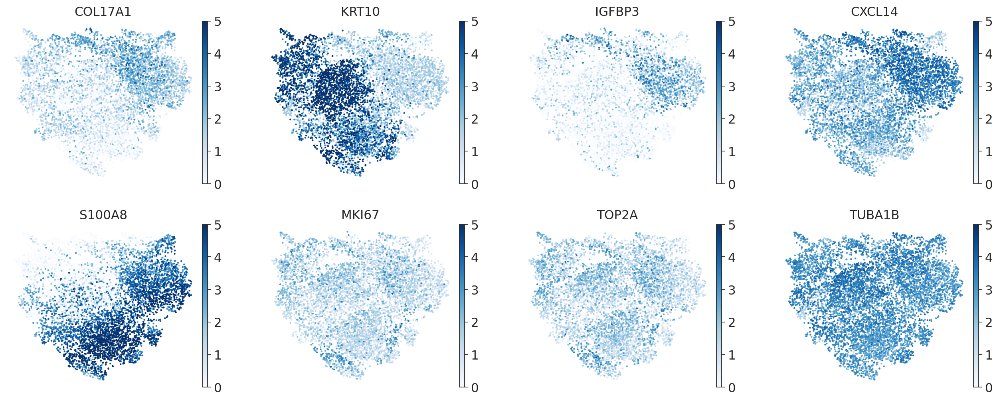

In [731]:
with rc_context({'figure.figsize': (4, 3.5)}):
    ax = sc.pl.umap(adata_ker_prol, color=['COL17A1', 'KRT10', 'IGFBP3', 'CXCL14', 'S100A8', 'MKI67', 'TOP2A',
                                           'TUBA1B', 
                                           ], ncols=4, show=False, frameon=False, \
        cmap='Blues', use_raw=True, vmin=0, vmax=5)
    plt.savefig('fig3/proliferating_kera_umap_markers.pdf', bbox_inches='tight')
    plt.show()

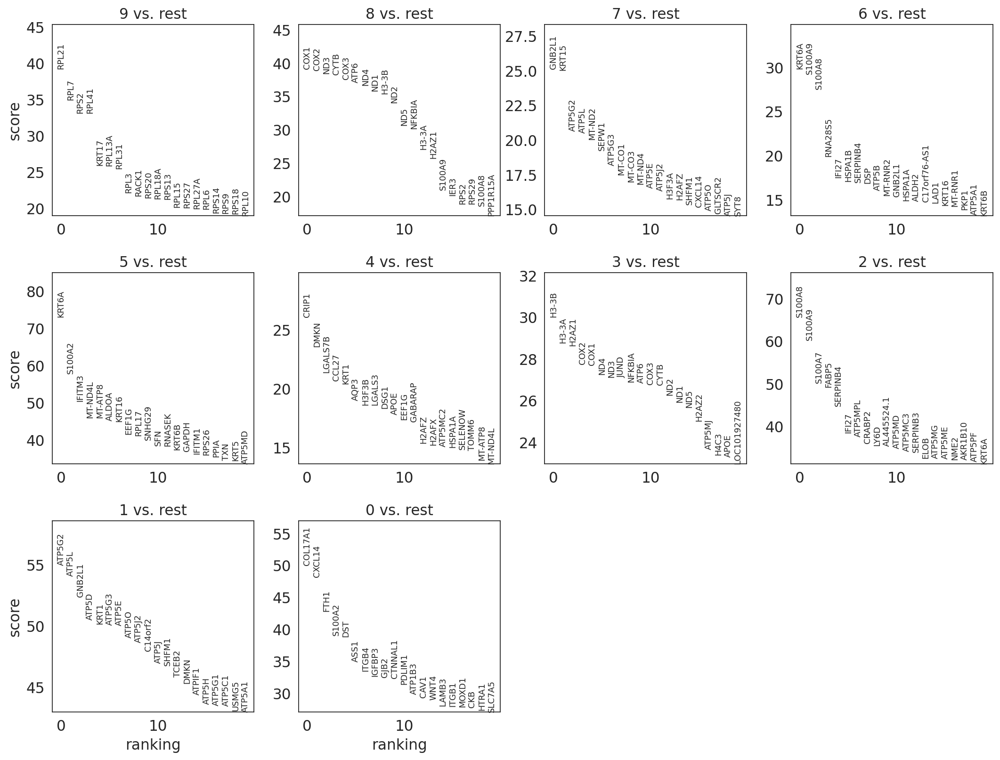

In [732]:
sc.tl.rank_genes_groups(adata_ker_prol, groupby='leiden_ker_prol', method='t-test', n_genes=20, tie_correct=True)
sc.pl.rank_genes_groups(adata_ker_prol, n_genes=20, sharey=False, show=False)

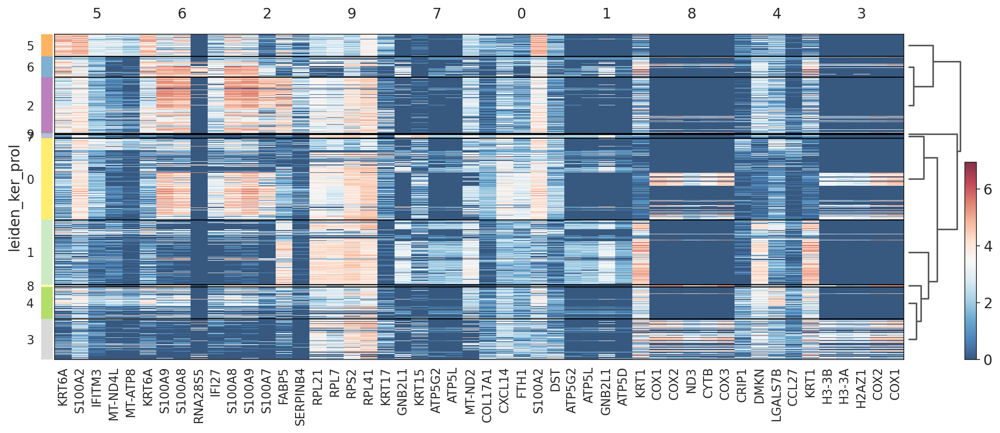

In [733]:
with rc_context({'figure.figsize': (4, 3.5)}):
    sc.pl.rank_genes_groups_heatmap(adata_ker_prol, n_genes=5, show_gene_labels=True, cmap='RdBu_r', show=False, alpha=0.8)
    plt.savefig('fig3/proliferating_kera_rank_genes_groups_heatmap.pdf', bbox_inches='tight')
    plt.show()

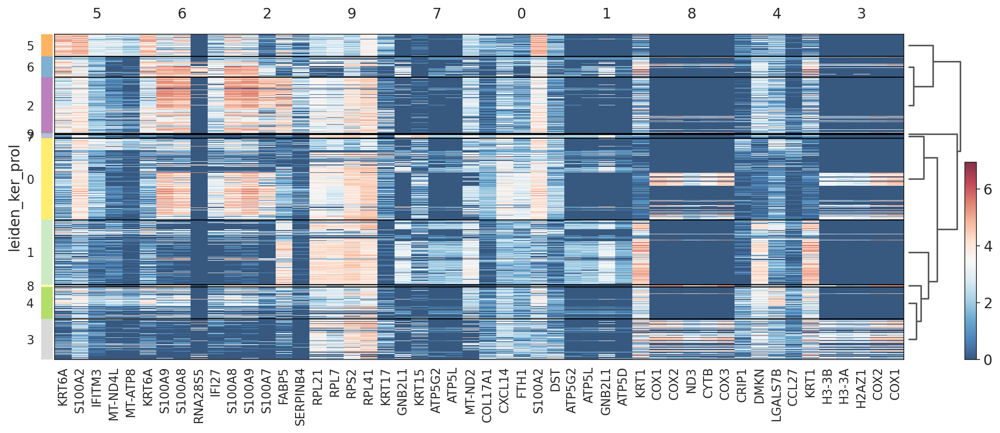

In [734]:
with rc_context({'figure.figsize': (4, 3.5)}):
    sc.pl.rank_genes_groups_heatmap(adata_ker_prol, n_genes=5, show_gene_labels=True, cmap='RdBu_r', show=False, alpha=0.8)
    plt.savefig('fig3/proliferating_kera_rank_genes_groups_heatmap.png', bbox_inches='tight')
    plt.show()

In [735]:
import numpy as np
adata_ker_prol_raw = adata_ker_prol.raw.to_adata()
adata_ker_prol_raw.layers['norm'] = np.expm1(adata_ker_prol_raw.X.copy())
adata_ker_prol_raw.layers['counts'] = adata_ker_prol_raw.layers['norm'].toarray() * adata_ker_prol_raw.obs['total_counts'].values[:, None] / 10000
adata_ker_prol_raw.layers['counts'] = adata_ker_prol_raw.layers['counts'].astype(int)

/tmp/ipykernel_2933095/2535207843.py:5: RuntimeWarning: invalid value encountered in cast
  adata_ker_prol_raw.layers['counts'] = adata_ker_prol_raw.layers['counts'].astype(int)


In [736]:
pdata = dc.get_pseudobulk(
    adata_ker_prol_raw,
    sample_col='Batch',
    groups_col='leiden_ker_prol',
    layer='counts',
    mode='sum',
    min_cells=5,
    min_counts=1000,
    skip_checks=True,
)
pdata

AnnData object with n_obs × n_vars = 207 × 28885
    obs: 'Batch', 'leiden_ker_prol', 'Disease', 'Certainty', 'Dataset', 'cell_type_leiden', 'leiden_ker', 'psbulk_n_cells', 'psbulk_counts'
    layers: 'psbulk_props'

In [737]:
pdata.layers['counts'] = pdata.X.copy()

sc.pp.normalize_total(pdata, target_sum=1e4)
sc.pp.log1p(pdata)

pdata.raw = pdata.copy()

In [738]:
pdata.obs['CXCL14_exp'] = pdata[:, 'CXCL14'].X.toarray().flatten()
pdata.obs['COL17A1_exp'] = pdata[:, 'COL17A1'].X.toarray().flatten()
pdata.obs['IGFBP3_exp'] = pdata[:, 'IGFBP3'].X.toarray().flatten()
pdata.obs['TUBA1B_exp'] = pdata[:, 'TUBA1B'].X.toarray().flatten()
pdata.obs['MKI67_exp'] = pdata[:, 'MKI67'].X.toarray().flatten()
order = list(map(str, range(0, pdata.obs['leiden_ker_prol'].nunique())))

/tmp/ipykernel_2933095/1416647347.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  g = sns.boxplot(data=pdata.obs, x='leiden_ker_prol', y='MKI67_exp', flierprops={"marker": ".", "alpha": 1, "markersize": 3}, palette=sns.palettes.color_palette((adata_ker_prol_raw.uns['leiden_ker_prol_colors'])), \
/tmp/ipykernel_2933095/1416647347.py:5: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  g.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., frameon=False)


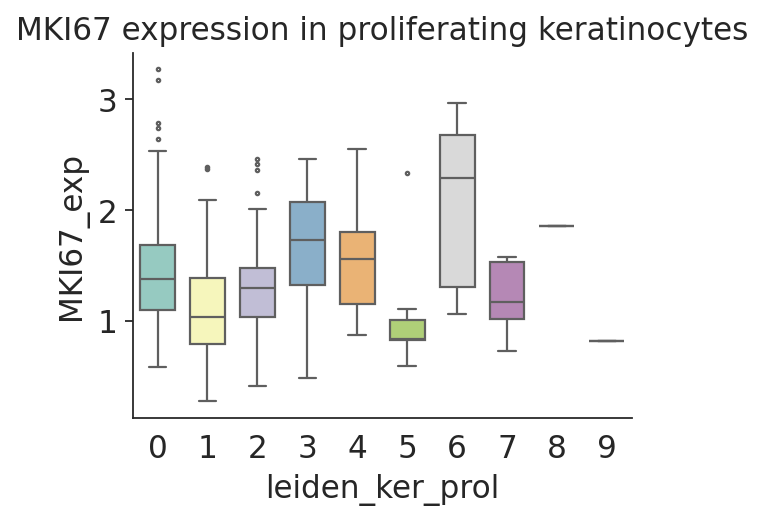

In [739]:
with rc_context({'figure.figsize': (4, 3)}):
    # order = list(map(str, range(0, 8)))
    g = sns.boxplot(data=pdata.obs, x='leiden_ker_prol', y='MKI67_exp', flierprops={"marker": ".", "alpha": 1, "markersize": 3}, palette=sns.palettes.color_palette((adata_ker_prol_raw.uns['leiden_ker_prol_colors'])), \
        order=order, width=0.7, linewidth=1)
    g.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., frameon=False)
    g.set_title('MKI67 expression in proliferating keratinocytes')
    sns.despine()
    g.yaxis.set_ticks_position('left')
    plt.savefig('fig3/proliferating_kera_boxplot_MKI67.pdf', bbox_inches='tight')
    plt.show()

/tmp/ipykernel_2933095/27244357.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  g = sns.boxplot(data=pdata.obs, x='leiden_ker_prol', y='TUBA1B_exp', flierprops={"marker": ".", "alpha": 1, "markersize": 3}, palette=sns.palettes.color_palette((adata_ker_prol_raw.uns['leiden_ker_prol_colors'])), \
/tmp/ipykernel_2933095/27244357.py:5: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  g.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., frameon=False)


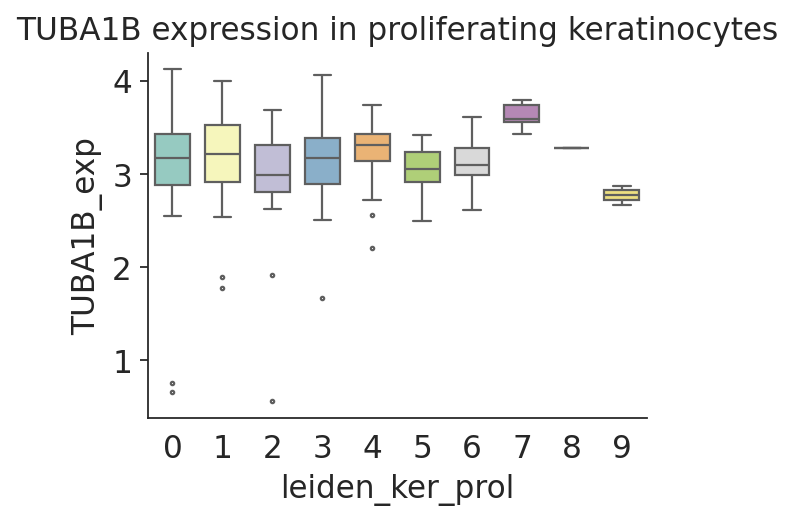

In [740]:
with rc_context({'figure.figsize': (4, 3)}):
    # order = list(map(str, range(0, 8)))
    g = sns.boxplot(data=pdata.obs, x='leiden_ker_prol', y='TUBA1B_exp', flierprops={"marker": ".", "alpha": 1, "markersize": 3}, palette=sns.palettes.color_palette((adata_ker_prol_raw.uns['leiden_ker_prol_colors'])), \
        order=order, width=0.7, linewidth=1)
    g.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., frameon=False)
    g.set_title('TUBA1B expression in proliferating keratinocytes')
    sns.despine()
    g.yaxis.set_ticks_position('left')

/tmp/ipykernel_2933095/518401980.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  g = sns.boxplot(data=pdata.obs, x='leiden_ker_prol', y='IGFBP3_exp', flierprops={"marker": ".", "alpha": 1, "markersize": 3}, palette=sns.palettes.color_palette((adata_ker_prol_raw.uns['leiden_ker_prol_colors'])), \
/tmp/ipykernel_2933095/518401980.py:5: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  g.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., frameon=False)


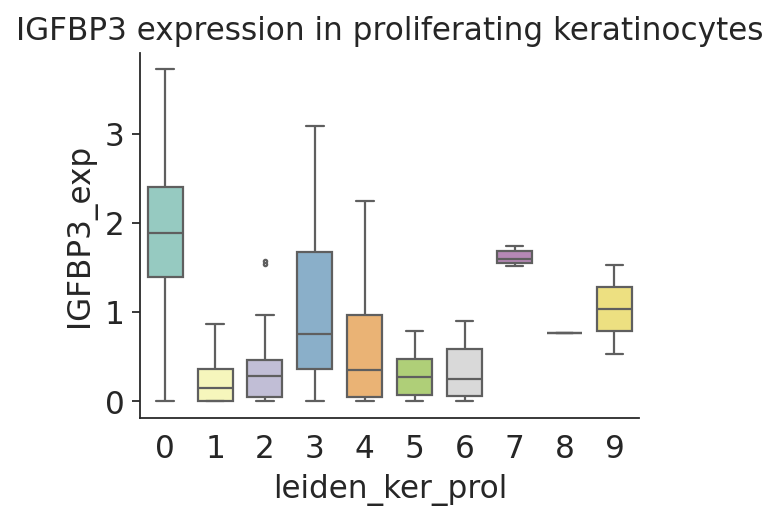

In [741]:
with rc_context({'figure.figsize': (4, 3)}):
    # order = list(map(str, range(0, 8)))
    g = sns.boxplot(data=pdata.obs, x='leiden_ker_prol', y='IGFBP3_exp', flierprops={"marker": ".", "alpha": 1, "markersize": 3}, palette=sns.palettes.color_palette((adata_ker_prol_raw.uns['leiden_ker_prol_colors'])), \
        order=order, width=0.7, linewidth=1)
    g.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., frameon=False)
    g.set_title('IGFBP3 expression in proliferating keratinocytes')
    sns.despine()
    g.yaxis.set_ticks_position('left')
    plt.savefig('fig3/proliferating_kera_boxplot_IGFBP3.pdf', bbox_inches='tight')

/tmp/ipykernel_2933095/3574100476.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  g = sns.boxplot(data=pdata.obs, x='leiden_ker_prol', y='COL17A1_exp', flierprops={"marker": ".", "alpha": 1, "markersize": 3}, palette=sns.palettes.color_palette((adata_ker_prol_raw.uns['leiden_ker_prol_colors'])), \
/tmp/ipykernel_2933095/3574100476.py:5: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  g.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., frameon=False)


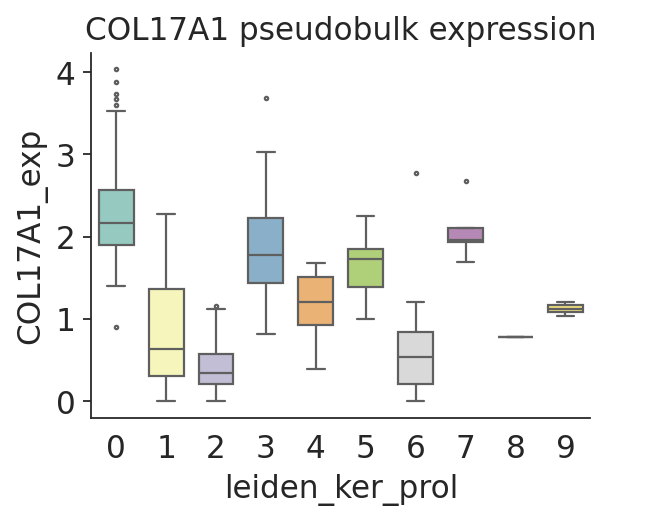

In [742]:
with rc_context({'figure.figsize': (4, 3)}):
    # order = list(map(str, range(0, 11)))
    g = sns.boxplot(data=pdata.obs, x='leiden_ker_prol', y='COL17A1_exp', flierprops={"marker": ".", "alpha": 1, "markersize": 3}, palette=sns.palettes.color_palette((adata_ker_prol_raw.uns['leiden_ker_prol_colors'])), \
        order=order, width=0.7, linewidth=1)
    g.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., frameon=False)
    g.set_title('COL17A1 pseudobulk expression')
    sns.despine()
    g.yaxis.set_ticks_position('left')
    plt.savefig('fig3/proliferating_kera_boxplot_COL17A1.pdf', bbox_inches='tight')

/tmp/ipykernel_2933095/4183773718.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  g = sns.boxplot(data=pdata.obs, x='leiden_ker_prol', y='CXCL14_exp', flierprops={"marker": ".", "alpha": 1, "markersize": 3}, palette=sns.palettes.color_palette((adata_ker_prol_raw.uns['leiden_ker_prol_colors'])), \
/tmp/ipykernel_2933095/4183773718.py:5: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  g.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., frameon=False)


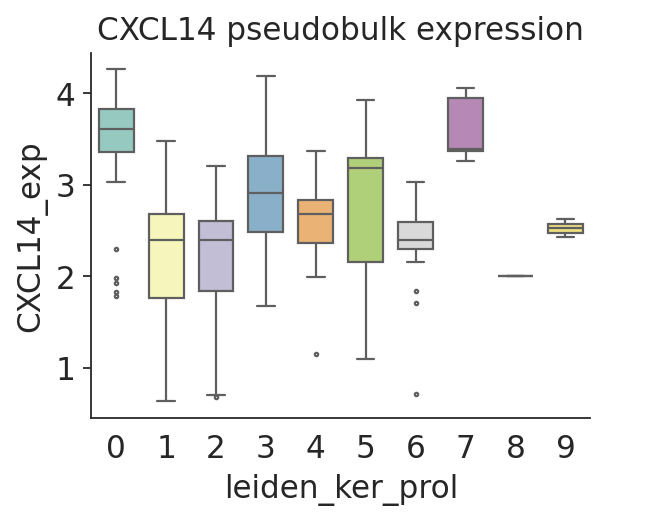

In [743]:
with rc_context({'figure.figsize': (4, 3)}):
    # order = list(map(str, range(0, 8)))
    g = sns.boxplot(data=pdata.obs, x='leiden_ker_prol', y='CXCL14_exp', flierprops={"marker": ".", "alpha": 1, "markersize": 3}, palette=sns.palettes.color_palette((adata_ker_prol_raw.uns['leiden_ker_prol_colors'])), \
        order=order, width=0.7, linewidth=1)
    g.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., frameon=False)
    g.set_title('CXCL14 pseudobulk expression')
    sns.despine()
    g.yaxis.set_ticks_position('left')
    plt.savefig('fig3/proliferating_kera_boxplot_CXCL14.pdf', bbox_inches='tight')